In [130]:
import sys
sys.path.append('../')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from helpers.cm26 import DatasetCM26
from helpers.selectors import *
from helpers.operators import Coarsen, Filtering, Subsampling, CoarsenKochkov, CoarsenWeighted, CoarsenKochkovMinMax
from helpers.state_functions import *

import hvplot
import cmocean

%load_ext autoreload
%autoreload 3

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [89]:
%%time 
ds = DatasetCM26(source='cmip6-3d')

CPU times: user 39.7 s, sys: 21 s, total: 1min
Wall time: 46.3 s


In [ ]:
# depth_selector = lambda x: x.isel(zl=np.arange(0,50,5))
# depth_selector(ds.data).zl.values
# Output:
# array([   5.03354979,   55.8532486 ,  110.09615326,  181.31245422,
#         330.00775146,  728.69207764, 1497.56188965, 2474.04296875,
#        3508.63305664, 4555.56591797])

In [90]:
ds = ds.select2d(time=0, zl=5)

In [101]:
%time dataset = ds.compute_subfilter_forcing(factor = 1, FGR_multiplier = 10, coarsening=CoarsenKochkovMinMax(), percentile=0.5)

CPU times: user 545 ms, sys: 4.89 ms, total: 549 ms
Wall time: 553 ms


In [102]:
%time dataset.data = dataset.data.compute()

CPU times: user 26.5 s, sys: 16.3 s, total: 42.8 s
Wall time: 9.42 s


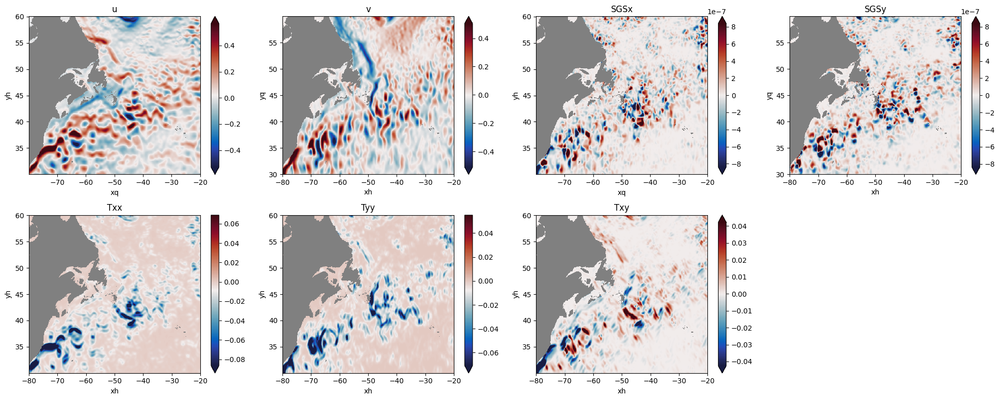

In [103]:
plt.figure(figsize=(20,8))
for num, (var, mask) in enumerate(zip(['u', 'v', 'SGSx', 'SGSy', 'Txx', 'Tyy', 'Txy'], 
                                 ['wet_u', 'wet_v', 'wet_u', 'wet_v', 'wet', 'wet', 'wet'])):
     plt.subplot(2,4,num+1)
     plot(dataset.data[var], dataset.param[mask], selector=select_Gulf, cartopy=False)
     plt.title(var)

plt.tight_layout()

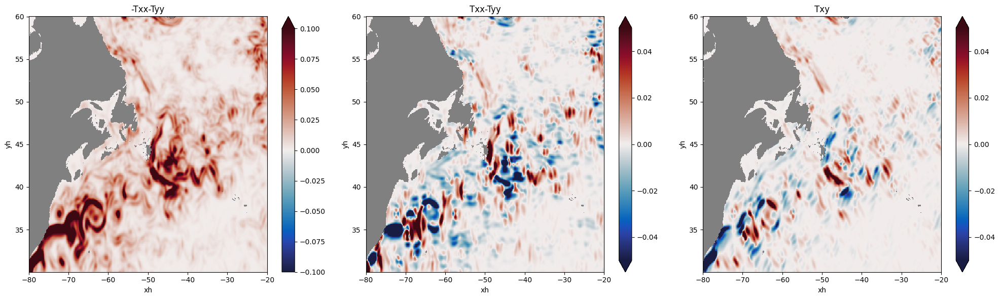

In [104]:
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plot(-dataset.data['Txx']-dataset.data['Tyy'], dataset.param['wet'], selector=select_Gulf, cartopy=False, vmin=-0.1, vmax=0.1)
plt.title('-Txx-Tyy')

plt.subplot(1,3,2)
plot(dataset.data['Txx']-dataset.data['Tyy'], dataset.param['wet'], selector=select_Gulf, cartopy=False, vmin=-0.05, vmax=0.05)
plt.title('Txx-Tyy')

plt.subplot(1,3,3)
plot(dataset.data['Txy'], dataset.param['wet'], selector=select_Gulf, cartopy=False, vmin=-0.05, vmax=0.05)
plt.title('Txy')


plt.tight_layout()

In [105]:
def divergence(Txy, Txx, Tyy, grid, param):
    Txyc = grid.interp(Txy,['X','Y']) * param.wet_c
    smagx = param.wet_u * (grid.diff(Txx*param.dyT**2, 'X') / param.dyCu     \
       + grid.diff(Txyc*param.dxBu**2, 'Y') / param.dxCu) \
       / (param.dxCu*param.dyCu)

    smagy = param.wet_v * (grid.diff(Txyc*param.dyBu**2, 'X') / param.dyCv     \
       + grid.diff(Tyy*param.dxT**2, 'Y') / param.dxCv) \
       / (param.dxCv*param.dyCv)
    return smagx.compute(), smagy.compute()

In [106]:
SGSx, SGSy = divergence(dataset.data.Txy, dataset.data.Txx, dataset.data.Tyy, dataset.grid, dataset.param)

Correlation: 0.9844941075132059
Relative Error: 0.14444560910055862
R2 =  0.9684130645210169
R2 max =  0.9691813020715518
Optinal scaling: 0.9726166270265135
Nans [test/control]: [165931, 165931]


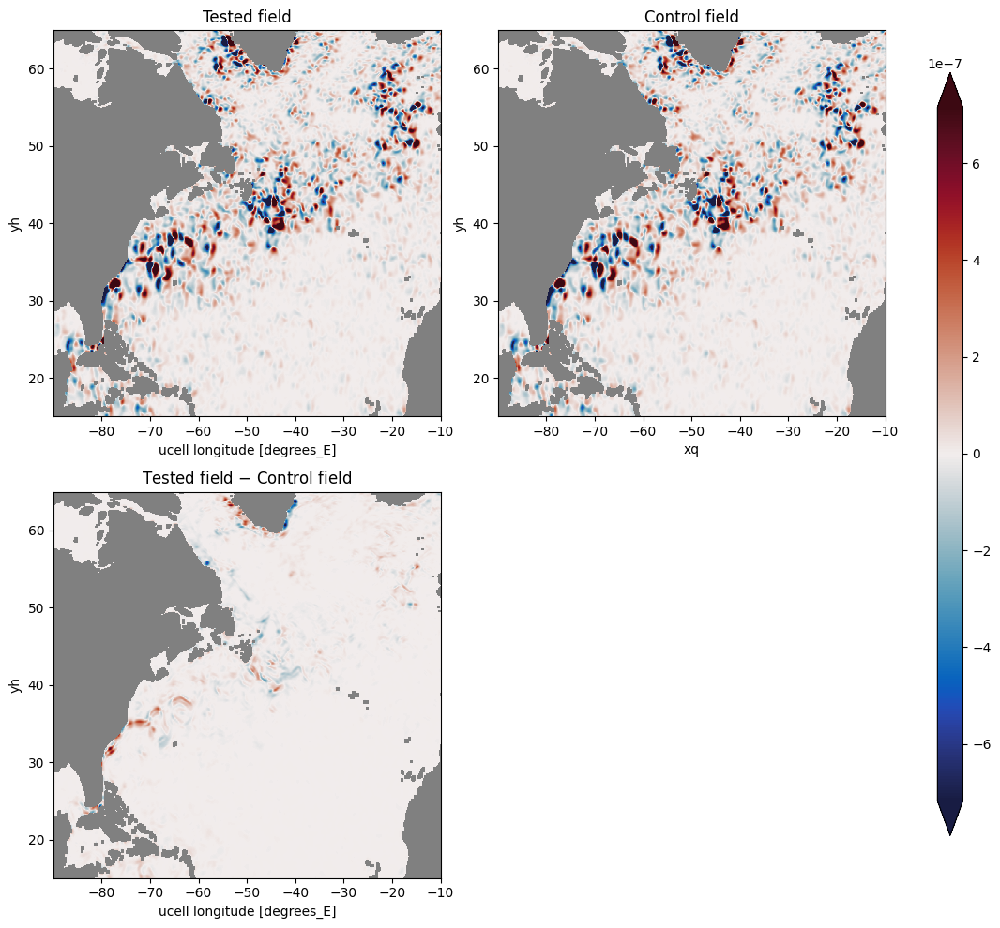

In [107]:
compare(dataset.nanvar(SGSx, 2), dataset.nanvar(dataset.data.SGSx, 2));

Correlation: 0.5896827164425087
Relative Error: 0.25268682511320595
R2 =  -0.49571217238454746
R2 max =  0.3476358731984517
Optinal scaling: 0.39099967470399816
Nans [test/control]: [146983, 146983]


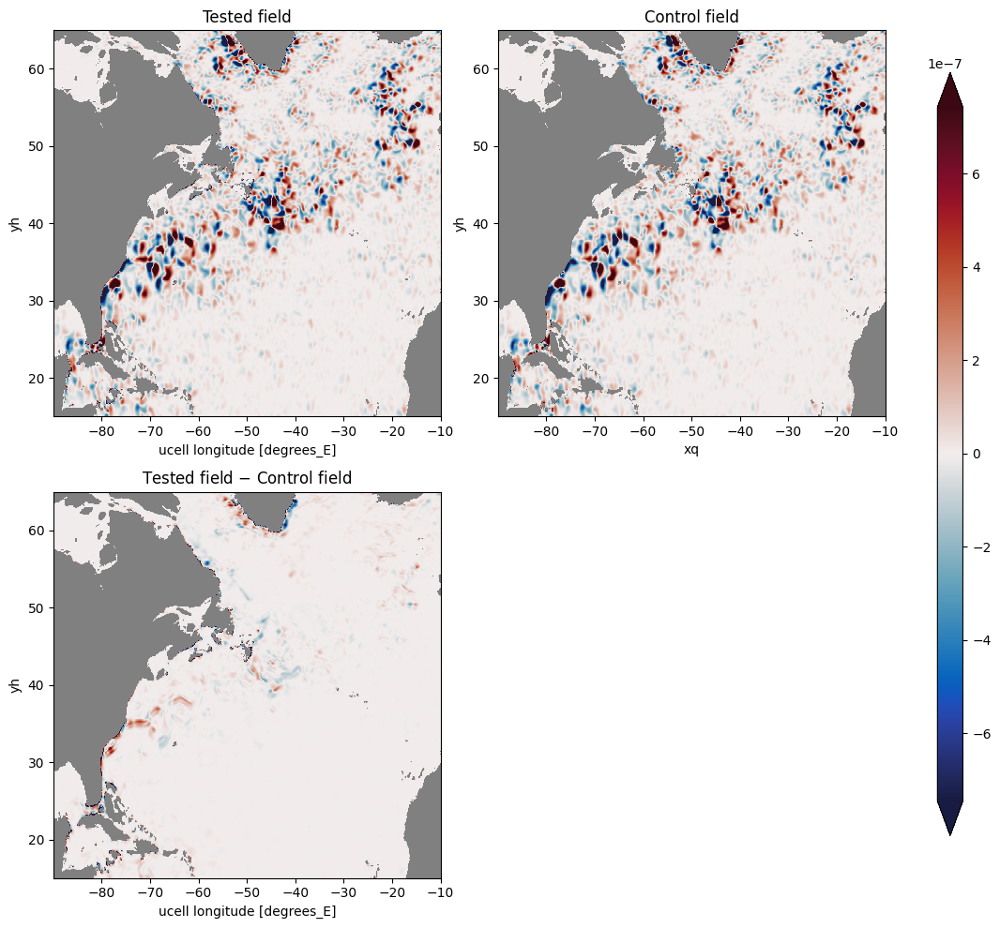

In [108]:
compare(dataset.nanvar(SGSx, 0), dataset.nanvar(dataset.data.SGSx, 0));

Correlation: 0.9840799181794324
Relative Error: 0.14068163800069974
R2 =  0.968049320033637
R2 max =  0.9682412736396003
Optinal scaling: 0.9861153776109488
Nans [test/control]: [166443, 166443]


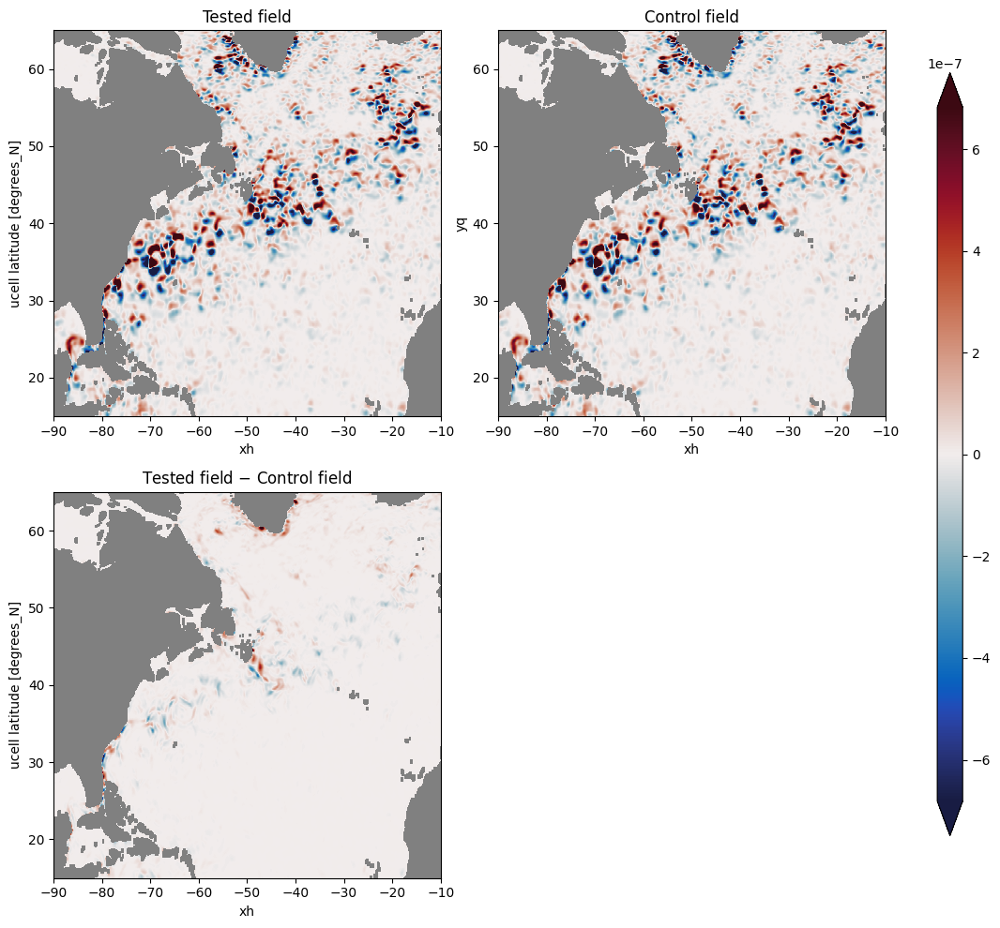

In [109]:
compare(dataset.nanvar(SGSy, 2), dataset.nanvar(dataset.data.SGSy, 2));

Correlation: 0.501363643547126
Relative Error: 0.27881263331945755
R2 =  -1.6734693118604387
R2 max =  0.2513652645613349
Optinal scaling: 0.26544755736184766
Nans [test/control]: [147527, 147527]


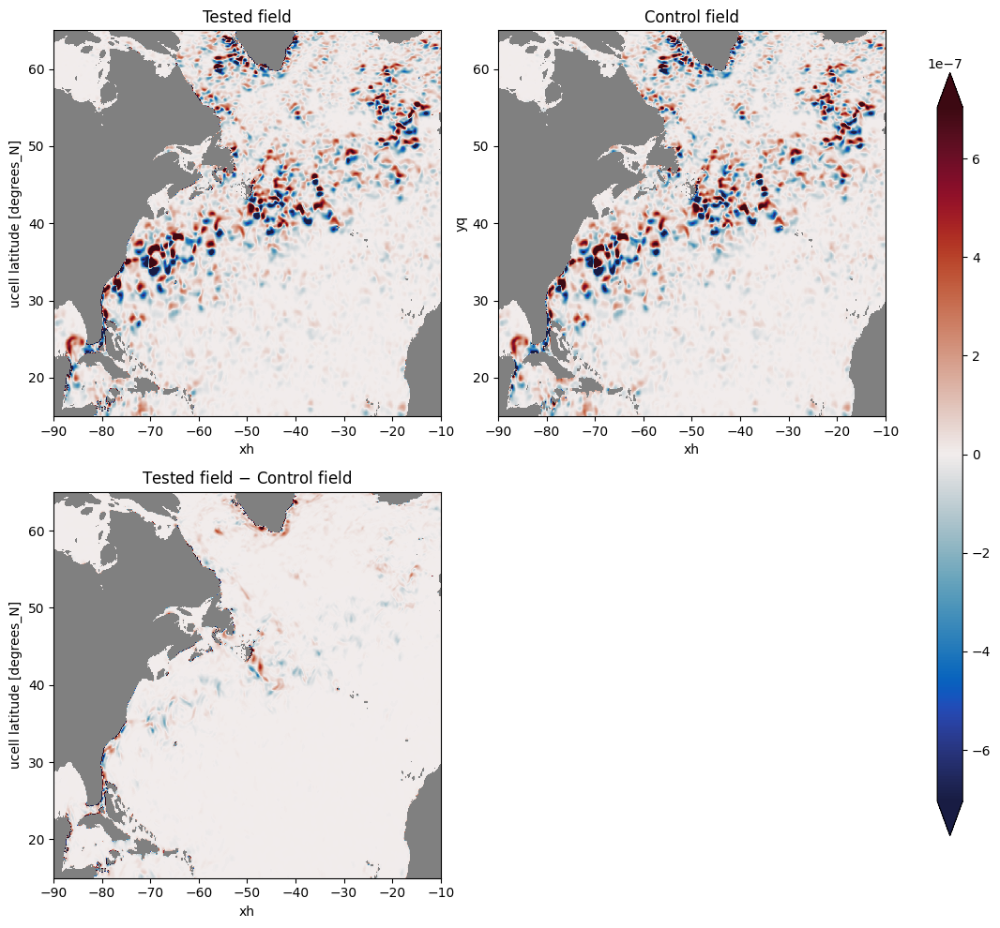

In [111]:
compare(dataset.nanvar(SGSy, 0), dataset.nanvar(dataset.data.SGSy, 0));

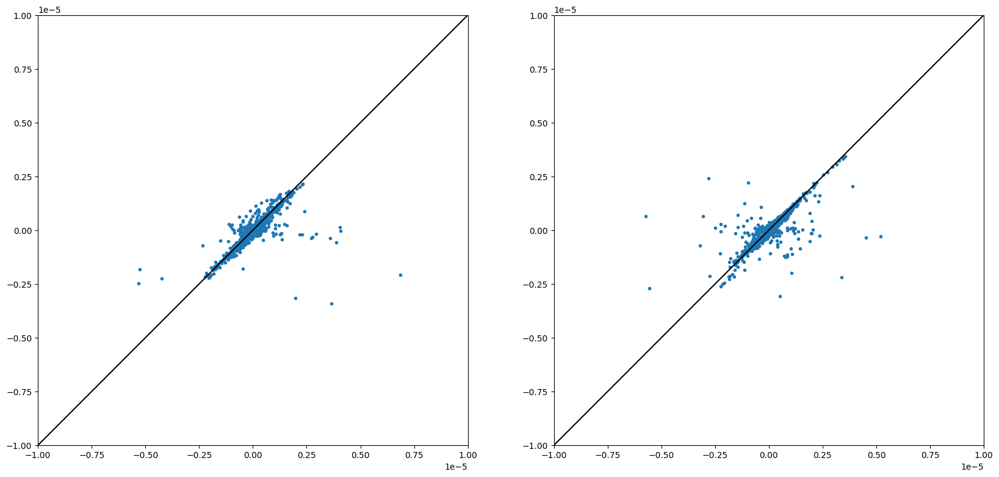

In [110]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.plot(select_NA(SGSx).values.ravel(), select_NA(dataset.data.SGSx).values.ravel(), marker='.', ls='', markevery=20)
plt.plot([-1e-5, 1e-5], [-1e-5, 1e-5], 'k')
plt.xlim([-1e-5, 1e-5]); plt.ylim([-1e-5, 1e-5])
plt.gca().set_aspect('equal')

plt.subplot(1,2,2)
plt.plot(select_NA(SGSy).values.ravel(), select_NA(dataset.data.SGSy).values.ravel(), marker='.', ls='', markevery=20)
plt.plot([-1e-5, 1e-5], [-1e-5, 1e-5], 'k')
plt.xlim([-1e-5, 1e-5]); plt.ylim([-1e-5, 1e-5])
plt.gca().set_aspect('equal')

# Is it commutation error near the boundary or difference between advective and flux formulations?

In [113]:
%time ds_coarse, \
    advx_hires, advy_hires, \
    advx_filtered_tendency, advy_filtered_tendency, \
    advx_filtered_state, advy_filtered_state, \
    SGSx, SGSy, \
    Txx_hires, Tyy_hires, Txy_hires, \
    Txx_filtered_tendency, Tyy_filtered_tendency, Txy_filtered_tendency, \
    Txx_filtered_state, Tyy_filtered_state, Txy_filtered_state, \
    Txx, Tyy, Txy  = ds.compute_subfilter_forcing(factor = 1, FGR_multiplier = 10, coarsening=CoarsenKochkovMinMax(), percentile=0.5, debug=True)

CPU times: user 543 ms, sys: 4.15 ms, total: 547 ms
Wall time: 550 ms


In [117]:
advx_hires_div, advy_hires_div = divergence(-Txy_hires, -Txx_hires, -Tyy_hires, dataset.grid, dataset.param)

Correlation: 0.9658990450725002
Relative Error: 0.19346188185141802
R2 =  0.9274500261471779
R2 max =  0.9329608599069151
Optinal scaling: 0.9286293962978258
Nans [test/control]: [146983, 146983]


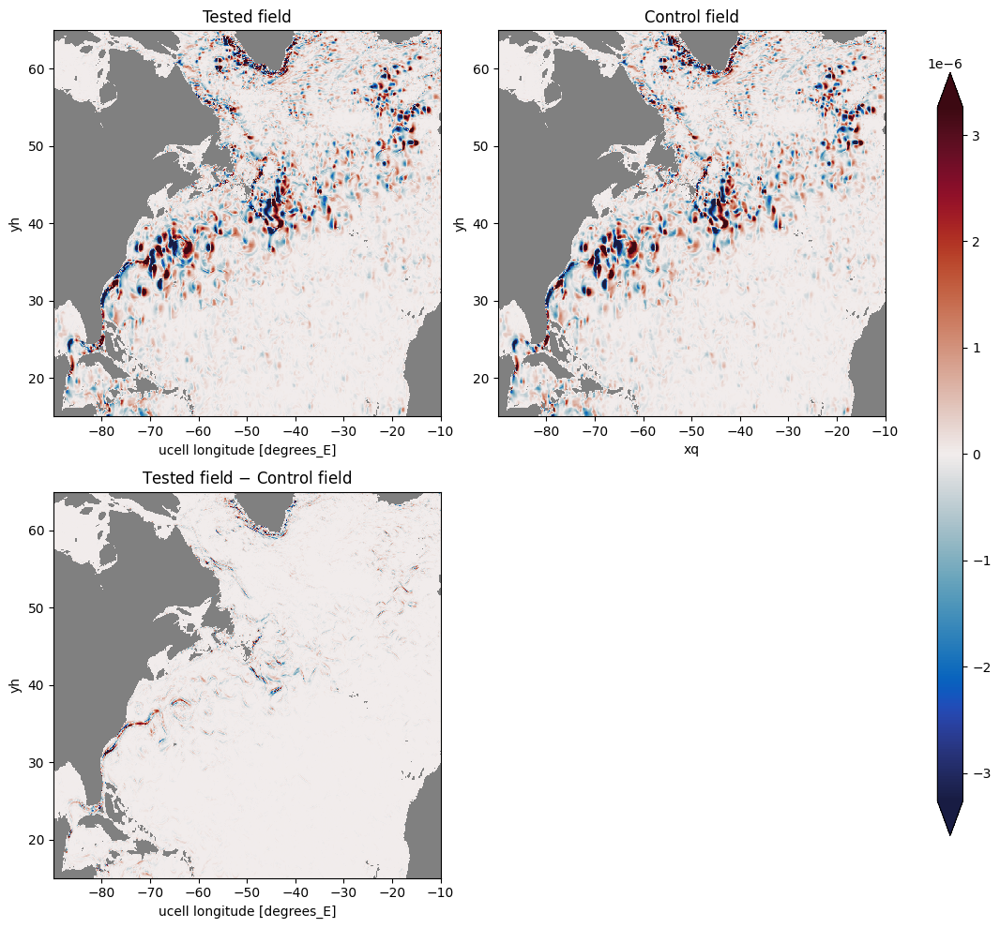

In [124]:
compare(dataset.nanvar(advx_hires_div, 0), dataset.nanvar(advx_hires, 0));

Correlation: 0.9653884638815389
Relative Error: 0.19479042654242706
R2 =  0.9261259523148825
R2 max =  0.9319478405775397
Optinal scaling: 0.9267513918539497
Nans [test/control]: [147527, 147527]


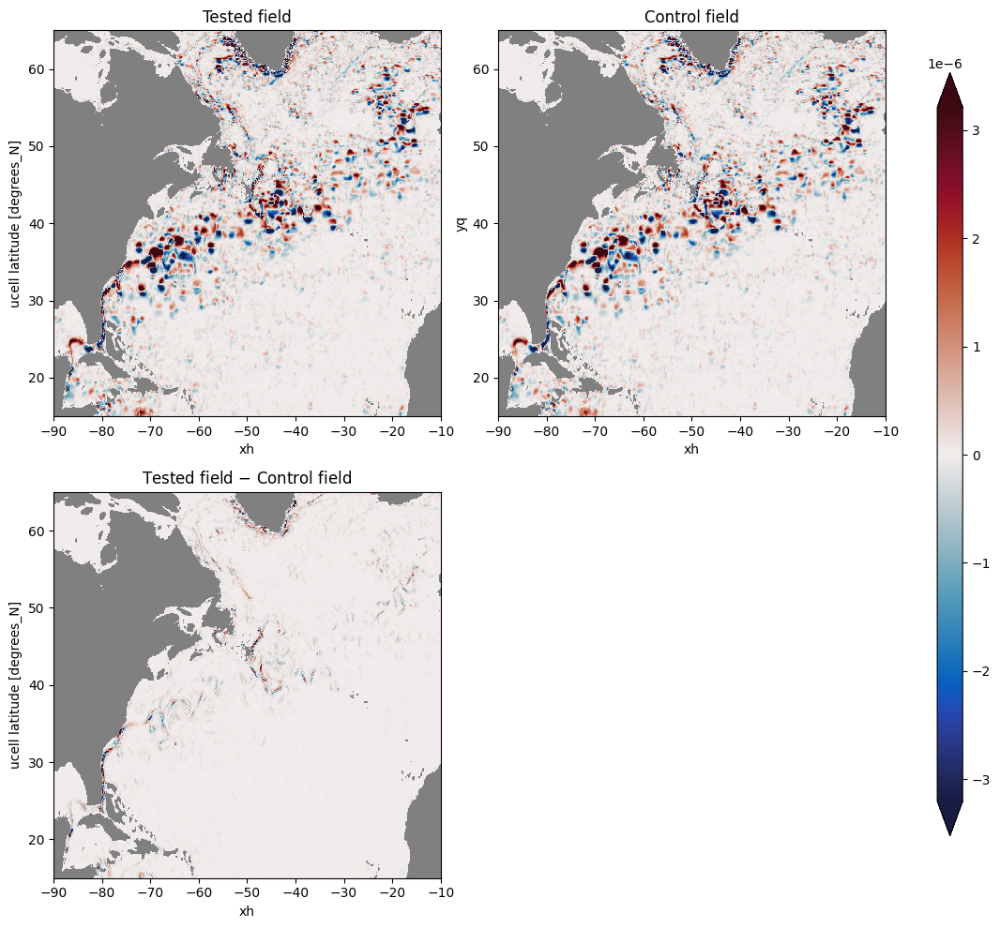

In [121]:
compare(dataset.nanvar(advy_hires_div, 0), dataset.nanvar(advy_hires, 0));

# Major difference between advective and flux forms are near the equator (no filtering yet)

Correlation: 0.956831895120026
Relative Error: 0.21900915805484172
R2 =  0.9040190267931917
R2 max =  0.9155223298683005
Optinal scaling: 0.8992057232627629
Nans [test/control]: [4019542, 4019542]


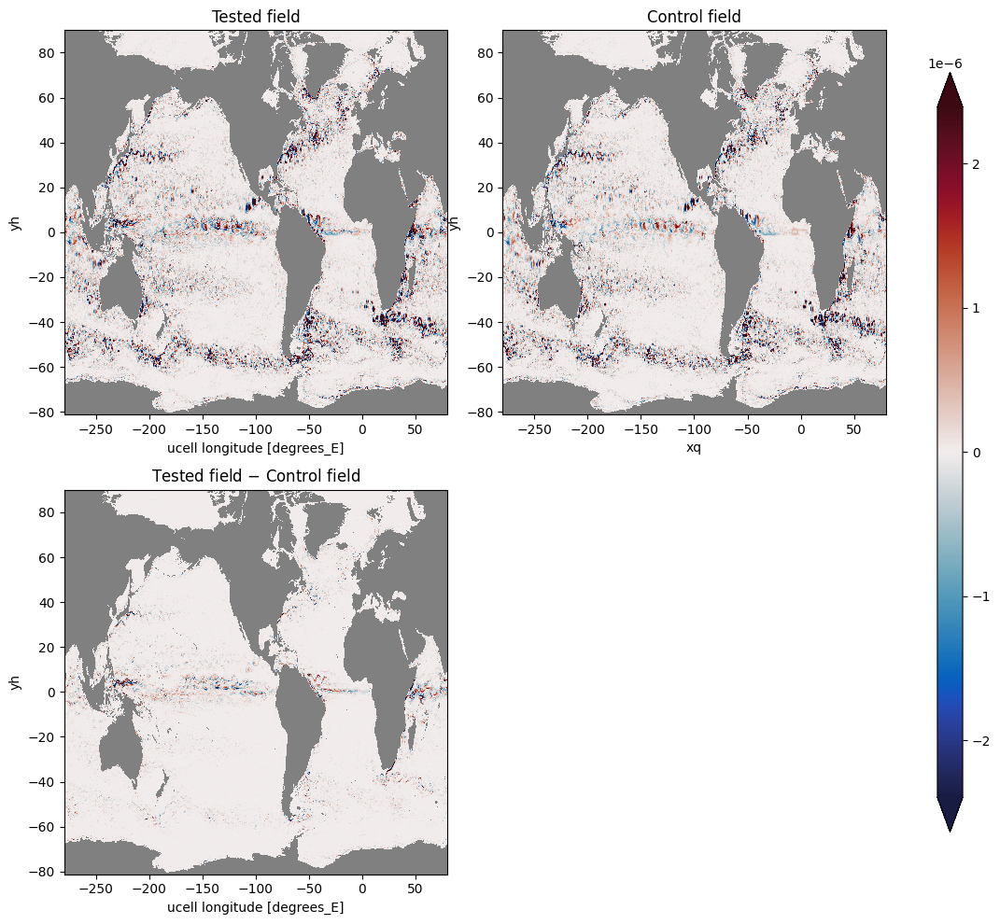

In [125]:
compare(dataset.nanvar(advx_hires_div, 0), dataset.nanvar(advx_hires, 0), selector=select_globe);

# Same but with filtering

In [126]:
SGSx, SGSy = divergence(dataset.data.Txy, dataset.data.Txx, dataset.data.Tyy, dataset.grid, dataset.param)

Correlation: 0.984633602901771
Relative Error: 0.14253403157055097
R2 =  0.968555068747519
R2 max =  0.9694925996186233
Optinal scaling: 0.9698407210333329
Nans [test/control]: [4235785, 4235785]


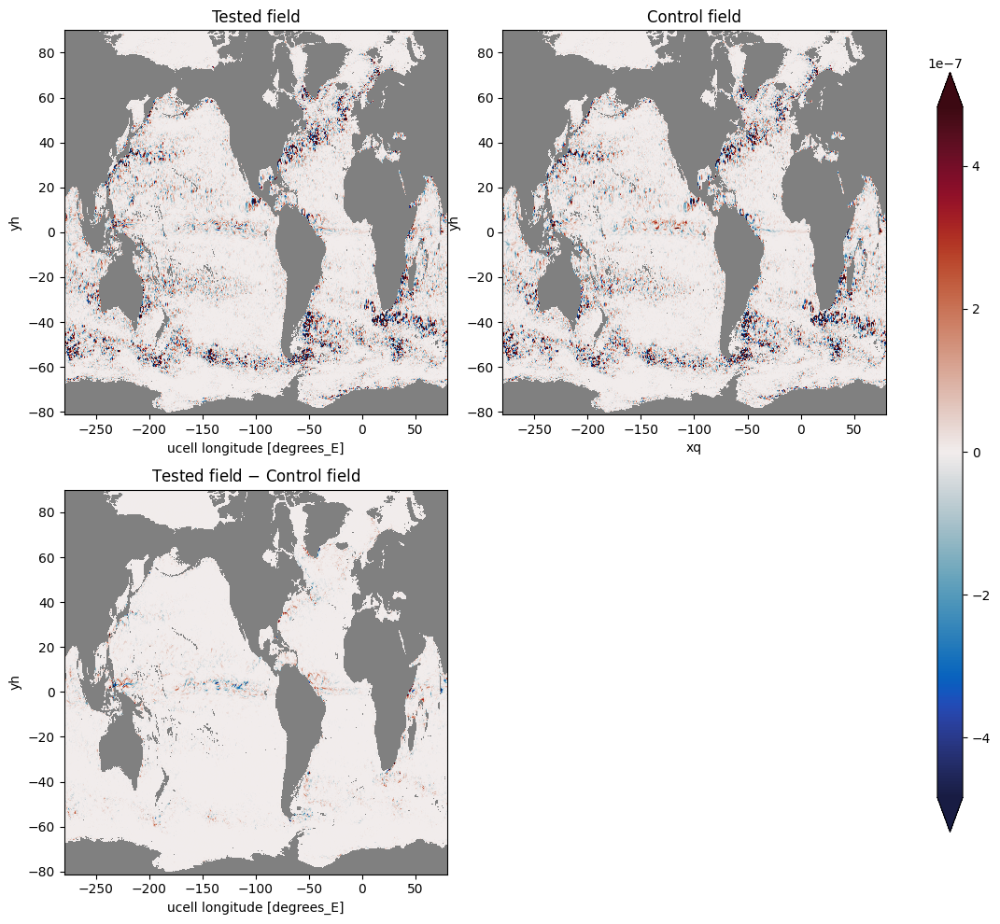

In [128]:
compare(dataset.nanvar(SGSx, 2), dataset.nanvar(dataset.data.SGSx, 2), selector=select_globe);

Correlation: 0.9262034764494279
Relative Error: 0.2625817585546046
R2 =  0.8499504634580147
R2 max =  0.8578471330600363
Optinal scaling: 0.9124555260623173
Nans [test/control]: [7882, 7882]


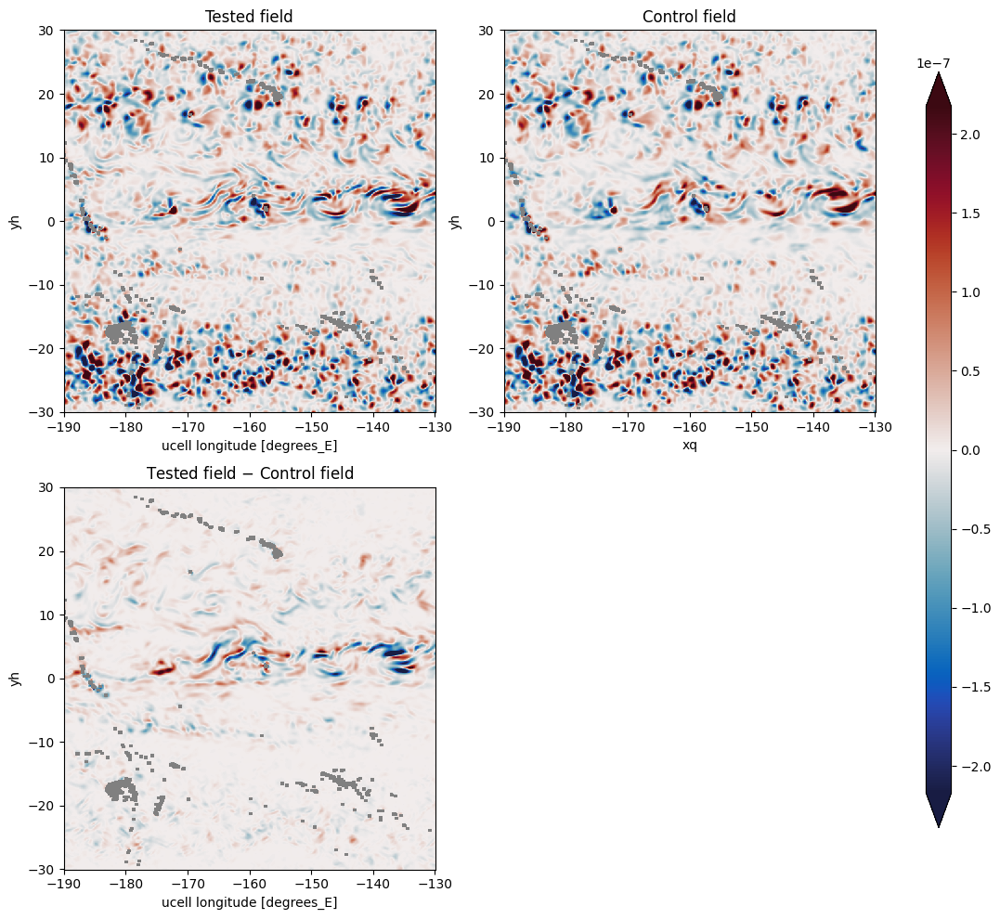

In [131]:
compare(dataset.nanvar(SGSx, 2), dataset.nanvar(dataset.data.SGSx, 2), selector=select_Equator);

Correlation: 0.969310511385418
Relative Error: 0.20170269934483231
R2 =  0.9367454831671762
R2 max =  0.9393660084013377
Optinal scaling: 0.9498323553005006
Nans [test/control]: [7910, 7910]


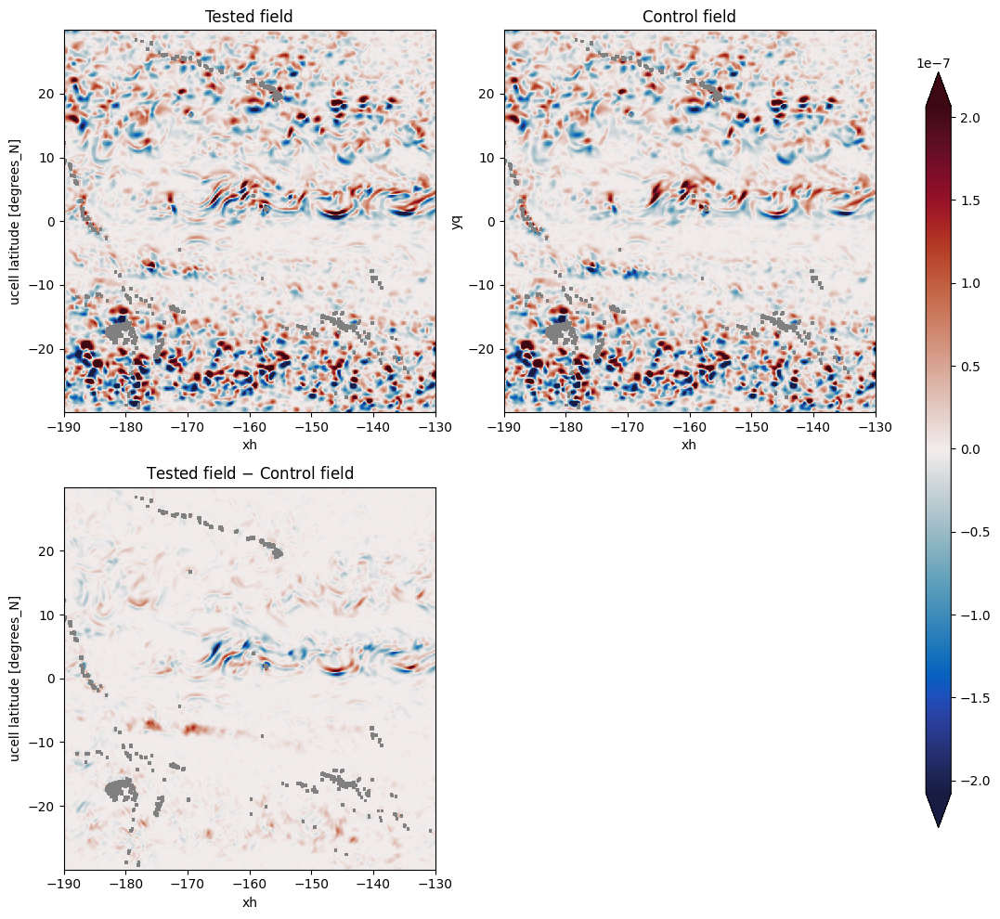

In [132]:
compare(dataset.nanvar(SGSy, 2), dataset.nanvar(dataset.data.SGSy, 2), selector=select_Equator);

# Check coarsegraining

In [133]:
%time dataset_coarse = ds.compute_subfilter_forcing(factor = 5, FGR_multiplier = 2, coarsening=CoarsenKochkovMinMax(), percentile=0.5)

CPU times: user 1.48 s, sys: 184 ms, total: 1.66 s
Wall time: 941 ms


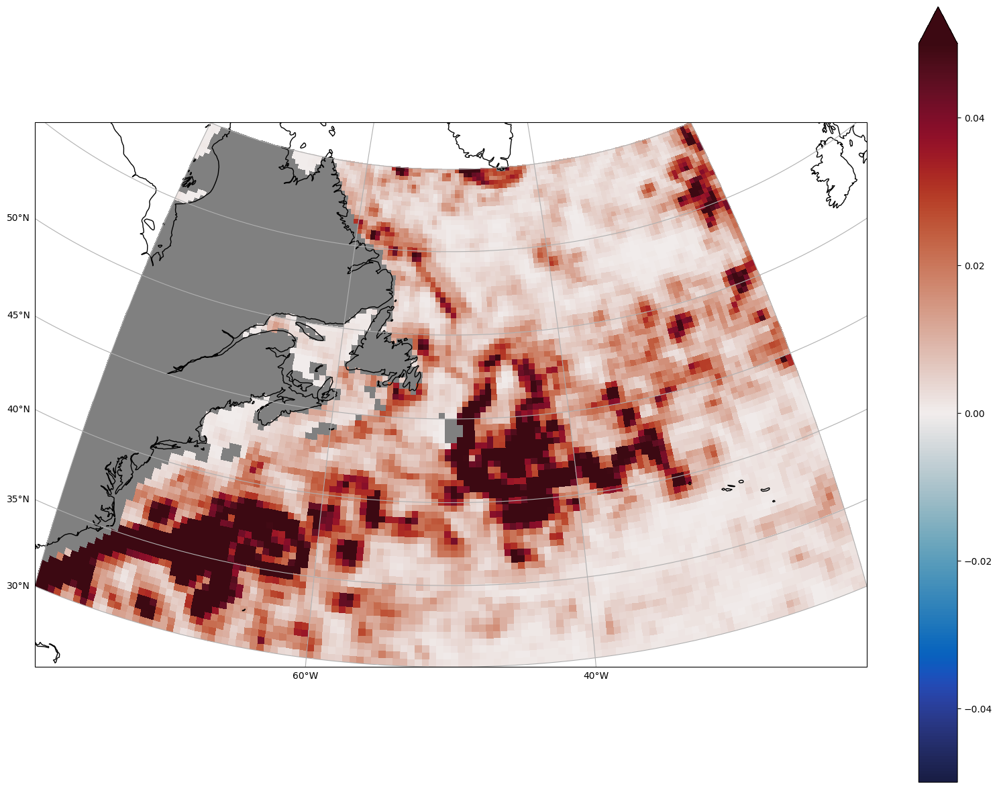

In [143]:
plot(dataset_coarse.nanvar(-dataset_coarse.data.Txx-dataset_coarse.data.Tyy), selector=select_Gulf, vmin=-0.05, vmax=0.05)

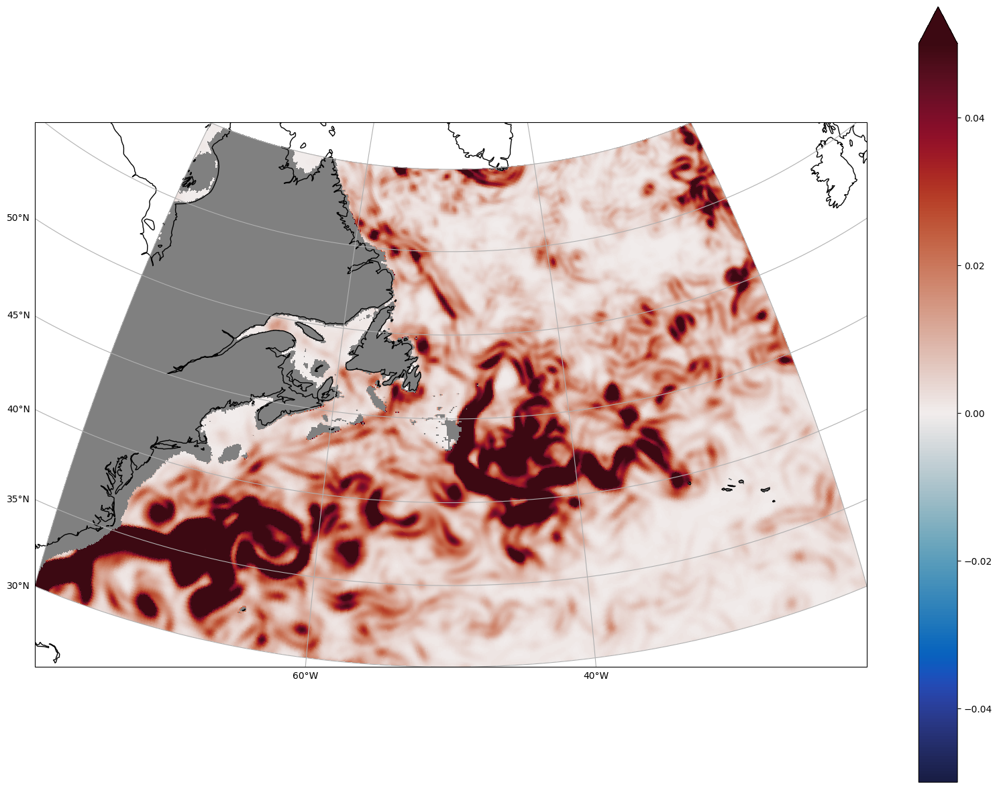

In [142]:
plot(dataset.nanvar(-dataset.data.Txx-dataset.data.Tyy), selector=select_Gulf, vmin=-0.05, vmax=0.05)

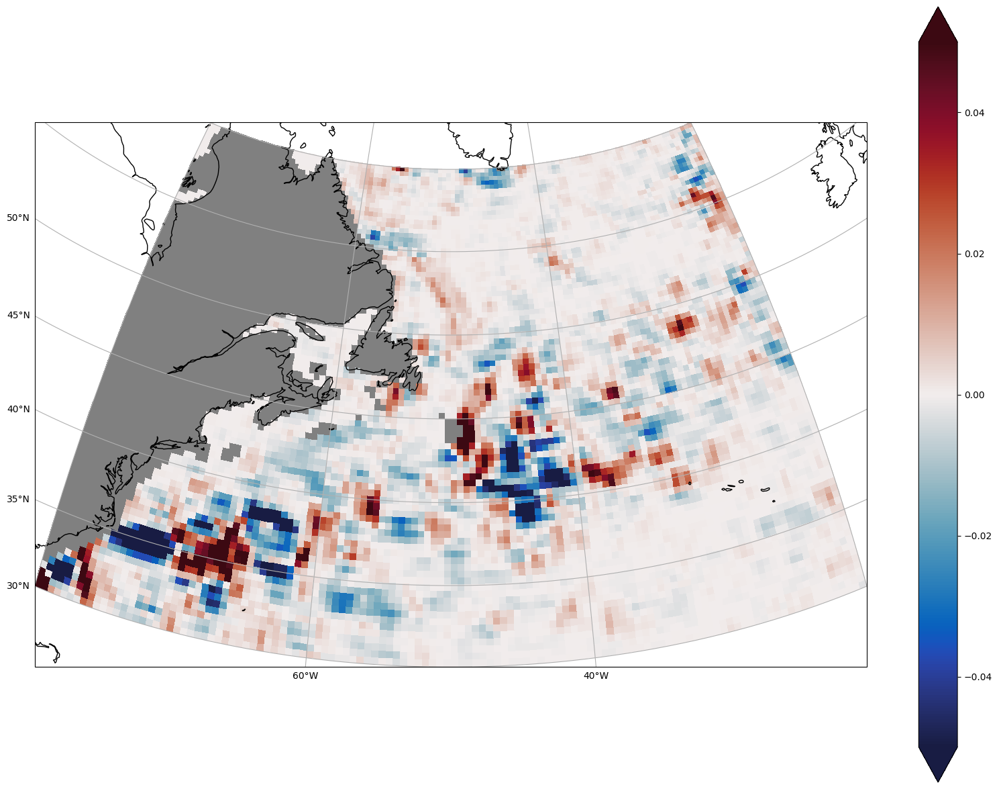

In [144]:
plot(dataset_coarse.nanvar(dataset_coarse.data.Txx-dataset_coarse.data.Tyy), selector=select_Gulf, vmin=-0.05, vmax=0.05)

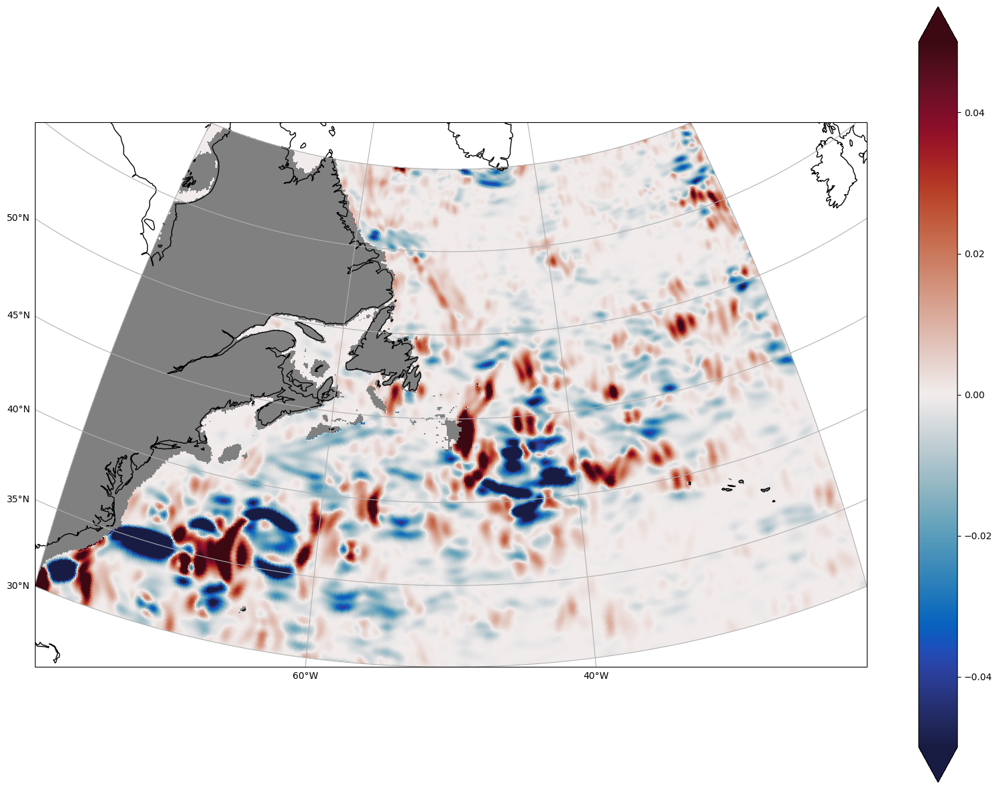

In [145]:
plot(dataset.nanvar(dataset.data.Txx-dataset.data.Tyy), selector=select_Gulf, vmin=-0.05, vmax=0.05)

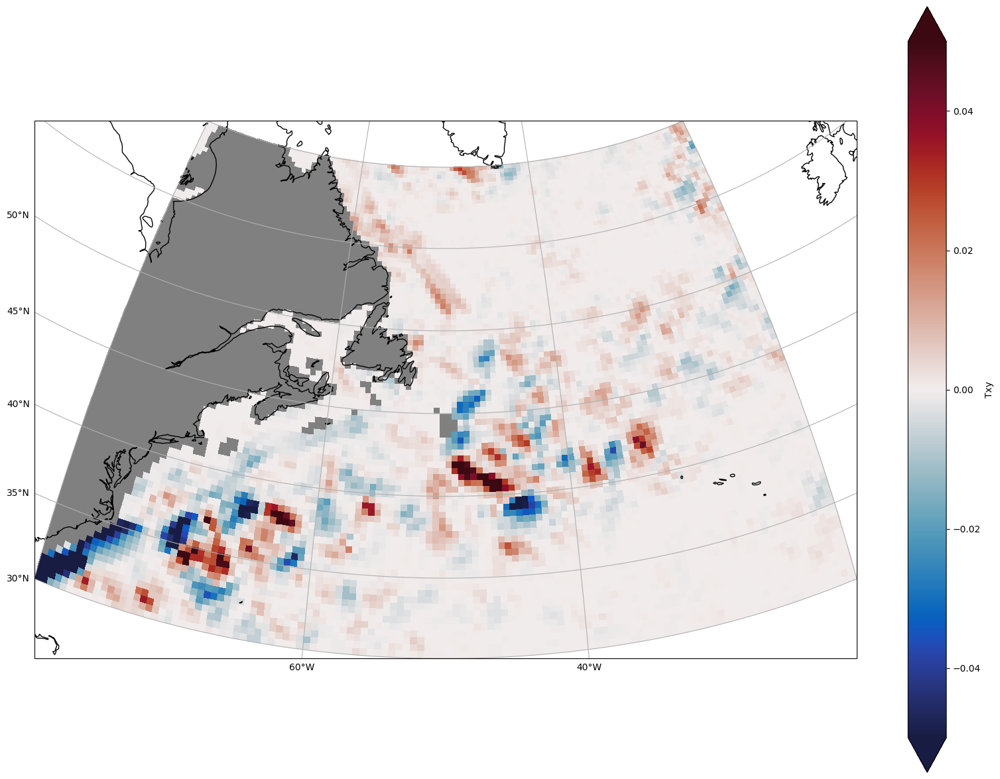

In [146]:
plot(dataset_coarse.nanvar(dataset_coarse.data.Txy), selector=select_Gulf, vmin=-0.05, vmax=0.05)

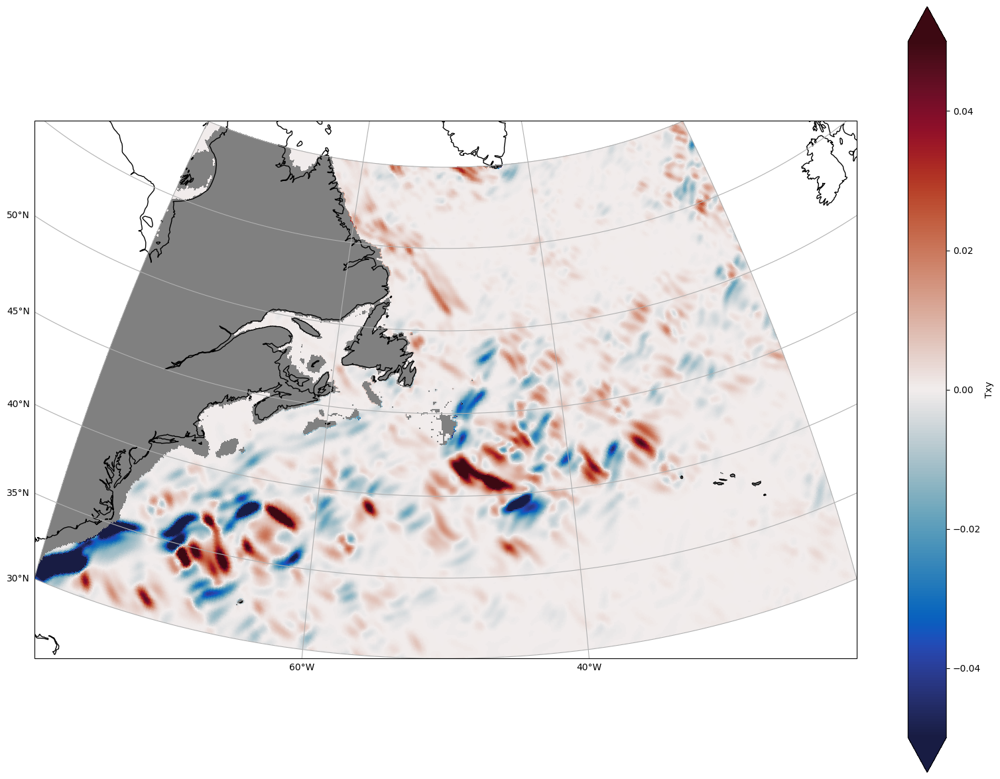

In [147]:
plot(dataset.nanvar(dataset.data.Txy), selector=select_Gulf, vmin=-0.05, vmax=0.05)